In [1]:
!pip install PyPDF2

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [2]:
import os
import PyPDF2

# Path to the folder containing the PDFs
folder_path = r'C:\Users\haris\Downloads\ARTICLES'

# List to store the extracted text from each PDF
climate_service_pdf_texts = []

# Loop through all the files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.pdf'):
        file_path = os.path.join(folder_path, filename)
        with open(file_path, 'rb') as file:
            # Create a PDF reader object
            pdf_reader = PyPDF2.PdfReader(file)
            # Extract text from each page
            text = ''
            for page in pdf_reader.pages:
                text += page.extract_text() if page.extract_text() else ''
            climate_service_pdf_texts.append(text)

# Check the number of PDFs read and display a snippet of the text
print(f"Number of PDFs read: {len(climate_service_pdf_texts)}")
print(climate_service_pdf_texts)  # Display first 500 characters of the first PDF

Number of PDFs read: 51
['Nature Biotechnology | Volume 42 | October 2024 | 1581–1593\n 1581\nnature biotechnologyhttps://doi.org/10.1038/s41587-023-02033-x\nArticle\nDiscovery of sparse, reliable omic \nbiomarkers with Stabl\nJulien Hédou1,16, Ivana Marić\u2009  \u20092,16, Grégoire Bellan\u2009  \u20093,16, Jakob Einhaus1,4,16, \nDyani K. Gaudillière\u2009  \u20095, Francois-Xavier Ladant6, Franck Verdonk\u2009  \u20091,7, \nIna A. Stelzer\u2009  \u20091,8, Dorien Feyaerts\u2009  \u20091, Amy S. Tsai\u2009  \u20091, Edward A. Ganio1, \nMaximilian Sabayev1, Joshua Gillard1,9, Jonas Amar1, Amelie Cambriel1, \nTomiko T . Oskotsky10, Alennie Roldan\u2009  \u200910, Jonathan L. Golob11, Marina Sirota\u2009  \u200910, \nThomas A. Bonham1, Masaki Sato\u2009  \u20091, Maïgane Diop1, Xavier Durand12, \nMartin S. Angst\u2009  \u20091, David K. Stevenson2, Nima Aghaeepour\u2009  \u20091,2,13, \nAndrea Montanari14,15 & Brice Gaudillière\u2009  \u20091,2 \nAdoption of high-content omic technologi

# Conversion to Lower Case

In [3]:
# Convert all the text in each PDF to lowercase
climate_service_pdf_texts_lower = [text.lower() for text in climate_service_pdf_texts]

In [4]:
climate_service_pdf_texts_lower

['nature biotechnology | volume 42 | october 2024 | 1581–1593\n 1581\nnature biotechnologyhttps://doi.org/10.1038/s41587-023-02033-x\narticle\ndiscovery of sparse, reliable omic \nbiomarkers with stabl\njulien hédou1,16, ivana marić\u2009  \u20092,16, grégoire bellan\u2009  \u20093,16, jakob einhaus1,4,16, \ndyani k. gaudillière\u2009  \u20095, francois-xavier ladant6, franck verdonk\u2009  \u20091,7, \nina a. stelzer\u2009  \u20091,8, dorien feyaerts\u2009  \u20091, amy s. tsai\u2009  \u20091, edward a. ganio1, \nmaximilian sabayev1, joshua gillard1,9, jonas amar1, amelie cambriel1, \ntomiko t . oskotsky10, alennie roldan\u2009  \u200910, jonathan l. golob11, marina sirota\u2009  \u200910, \nthomas a. bonham1, masaki sato\u2009  \u20091, maïgane diop1, xavier durand12, \nmartin s. angst\u2009  \u20091, david k. stevenson2, nima aghaeepour\u2009  \u20091,2,13, \nandrea montanari14,15 & brice gaudillière\u2009  \u20091,2 \nadoption of high-content omic technologies in clinical studies, 

In [4]:
len(climate_service_pdf_texts_lower)

51

In [7]:
len(climate_service_pdf_texts_lower[10])

81331

In [66]:
total_length = sum(len(article) for article in climate_service_pdf_texts_lower)
print("Total Words Across the Articles", total_length)

Total Words Across the Articles 5534071


# Implementation of Regex tokenization

In [7]:
import re

# Regex pattern for tokenization: words containing alphabets (ignores punctuation and numbers)
pattern = r'\b[a-zA-Z]+\b'

# Tokenize the text for each PDF using regex
climate_service_pdf_tokens = [re.findall(pattern, text) for text in climate_service_pdf_texts_lower]

print(climate_service_pdf_tokens[2])

['nature', 'biotechnology', 'volume', 'october', 'nature', 'biotechnologyhttps', 'doi', 'org', 'article', 'encapsulated', 'stem', 'cell', 'derived', 'cells', 'exert', 'glucose', 'control', 'in', 'patients', 'with', 'type', 'diabetes', 'bart', 'keymeulen', 'kaat', 'de', 'groot', 'daniel', 'jacobs', 'tulleneers', 'thevissen', 'david', 'm', 'melena', 'd', 'evert', 'j', 'kroon', 'mark', 'richard', 'wang', 'manasi', 'timothy', 'j', 'howard', 'l', 'foyt', 'daniel', 'pipeleers', 'clinical', 'studies', 'on', 'the', 'treatment', 'of', 'type', 'diabetes', 'with', 'device', 'encapsulated', 'pancreatic', 'precursor', 'cells', 'derived', 'from', 'human', 'embryonic', 'stem', 'cells', 'found', 'that', 'insulin', 'output', 'was', 'insufficient', 'for', 'clinical', 'benefit', 'we', 'are', 'conducting', 'a', 'phase', 'open', 'label', 'multicenter', 'trial', 'aimed', 'at', 'optimizing', 'cell', 'engraftment', 'clinicaltrials', 'gov', 'identifier', 'here', 'we', 'report', 'interim', 'year', 'outcomes', '

# Stopwords Removal

In [69]:
import nltk
from nltk.corpus import stopwords

# Get the list of English stop words
stop_words = set(stopwords.words('english'))

# Remove stop words from each PDF's token list
climate_service_pdf_tokens_no_stopwords = [
    [word for word in tokens if word not in stop_words]
    for tokens in climate_service_pdf_tokens
]

# Calculate the total number of words removed
total_words_removed = sum(len(tokens) - len(climate_service_pdf_tokens_no_stopwords[i])
                          for i, tokens in enumerate(climate_service_pdf_tokens))

# Print the total number of words removed
print(f"Total number of Stop words removed: {total_words_removed}")


Total number of Stop words removed: 235882


In [7]:
import nltk
from nltk.corpus import stopwords

# Get the list of English stop words
stop_words = set(stopwords.words('english'))

# Remove stop words from each PDF's token list
climate_service_pdf_tokens_no_stopwords = [
    [word for word in tokens if word not in stop_words]
    for tokens in climate_service_pdf_tokens
]

climate_service_pdf_tokens_no_stopwords

[['nature',
  'biotechnology',
  'volume',
  'october',
  'nature',
  'biotechnologyhttps',
  'doi',
  'org',
  'x',
  'article',
  'discovery',
  'sparse',
  'reliable',
  'omic',
  'biomarkers',
  'stabl',
  'julien',
  'ivana',
  'bellan',
  'jakob',
  'dyani',
  'k',
  'francois',
  'xavier',
  'franck',
  'verdonk',
  'ina',
  'stelzer',
  'dorien',
  'feyaerts',
  'amy',
  'tsai',
  'edward',
  'maximilian',
  'joshua',
  'jonas',
  'amelie',
  'tomiko',
  'alennie',
  'roldan',
  'jonathan',
  'l',
  'marina',
  'sirota',
  'thomas',
  'masaki',
  'sato',
  'xavier',
  'martin',
  'angst',
  'david',
  'k',
  'nima',
  'aghaeepour',
  'andrea',
  'brice',
  'adoption',
  'high',
  'content',
  'omic',
  'technologies',
  'clinical',
  'studies',
  'coupled',
  'computational',
  'methods',
  'yielded',
  'abundance',
  'candidate',
  'biomarkers',
  'however',
  'translating',
  'findings',
  'bona',
  'fide',
  'clinical',
  'biomarkers',
  'remains',
  'challenging',
  'facili

# Manual removal of unrelevant words

In [11]:
# Define a list of additional irrelevant/meaningless words (add more if needed)
irrelevant_words = {"etc", "thus", "also", "use", "used", "using", "many",'article','data','doi'}

# Function to clean the tokens based on the specified criteria
def clean_tokens(tokens):
    cleaned = [
        word for word in tokens
        if len(word) > 3 and               # Keep words longer than 3 characters
           "https" not in word and         # Exclude words containing "https"
           word not in irrelevant_words    # Exclude additional irrelevant words
    ]
    return cleaned

# Apply the cleaning function to all PDFs' token lists
climate_service_pdf_tokens_cleaned = [clean_tokens(tokens) for tokens in climate_service_pdf_tokens_no_stopwords]

climate_service_pdf_tokens_cleaned

[['nature',
  'biotechnology',
  'volume',
  'october',
  'nature',
  'discovery',
  'sparse',
  'reliable',
  'omic',
  'biomarkers',
  'stabl',
  'julien',
  'ivana',
  'bellan',
  'jakob',
  'dyani',
  'francois',
  'xavier',
  'franck',
  'verdonk',
  'stelzer',
  'dorien',
  'feyaerts',
  'tsai',
  'edward',
  'maximilian',
  'joshua',
  'jonas',
  'amelie',
  'tomiko',
  'alennie',
  'roldan',
  'jonathan',
  'marina',
  'sirota',
  'thomas',
  'masaki',
  'sato',
  'xavier',
  'martin',
  'angst',
  'david',
  'nima',
  'aghaeepour',
  'andrea',
  'brice',
  'adoption',
  'high',
  'content',
  'omic',
  'technologies',
  'clinical',
  'studies',
  'coupled',
  'computational',
  'methods',
  'yielded',
  'abundance',
  'candidate',
  'biomarkers',
  'however',
  'translating',
  'findings',
  'bona',
  'fide',
  'clinical',
  'biomarkers',
  'remains',
  'challenging',
  'facilitate',
  'process',
  'introduce',
  'stabl',
  'general',
  'machine',
  'learning',
  'method',
  '

# Lemmentization

from nltk.stem import WordNetLemmatizer

# Initialize the WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

# Lemmatize the tokens for each PDF
climate_service_pdf_tokens_lemmatized = [
    [lemmatizer.lemmatize(word) for word in tokens]
    for tokens in climate_service_pdf_tokens_cleaned
]

climate_service_pdf_tokens_lemmatized


# Visualization

In [12]:
from nltk.stem import WordNetLemmatizer

# Initialize the WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

# Lemmatize the tokens for each PDF
climate_service_pdf_tokens_lemmatized = [
    [lemmatizer.lemmatize(word) for word in tokens]
    for tokens in climate_service_pdf_tokens_cleaned
]

climate_service_pdf_tokens_lemmatized

[['nature',
  'biotechnology',
  'volume',
  'october',
  'nature',
  'discovery',
  'sparse',
  'reliable',
  'omic',
  'biomarkers',
  'stabl',
  'julien',
  'ivana',
  'bellan',
  'jakob',
  'dyani',
  'francois',
  'xavier',
  'franck',
  'verdonk',
  'stelzer',
  'dorien',
  'feyaerts',
  'tsai',
  'edward',
  'maximilian',
  'joshua',
  'jonas',
  'amelie',
  'tomiko',
  'alennie',
  'roldan',
  'jonathan',
  'marina',
  'sirota',
  'thomas',
  'masaki',
  'sato',
  'xavier',
  'martin',
  'angst',
  'david',
  'nima',
  'aghaeepour',
  'andrea',
  'brice',
  'adoption',
  'high',
  'content',
  'omic',
  'technology',
  'clinical',
  'study',
  'coupled',
  'computational',
  'method',
  'yielded',
  'abundance',
  'candidate',
  'biomarkers',
  'however',
  'translating',
  'finding',
  'bona',
  'fide',
  'clinical',
  'biomarkers',
  'remains',
  'challenging',
  'facilitate',
  'process',
  'introduce',
  'stabl',
  'general',
  'machine',
  'learning',
  'method',
  'identi

In [70]:
from nltk.stem import WordNetLemmatizer

# Initialize the WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

# Lemmatize the tokens for each PDF
climate_service_pdf_tokens_lemmatized = [
    [lemmatizer.lemmatize(word) for word in tokens]
    for tokens in climate_service_pdf_tokens_cleaned
]

# Calculate the total number of words lemmatized
total_words_lemmatized = sum(len(tokens) for tokens in climate_service_pdf_tokens_cleaned)

# Calculate the total number of unique lemmatized words
total_unique_lemmatized = sum(len(set(tokens)) for tokens in climate_service_pdf_tokens_lemmatized)

# Calculate the number of words lemmatized
total_lemmatized_count = total_words_lemmatized - total_unique_lemmatized

# Print the total number of words lemmatized
print(f"Total number of words lemmatized: {total_lemmatized_count}")


Total number of words lemmatized: 301770


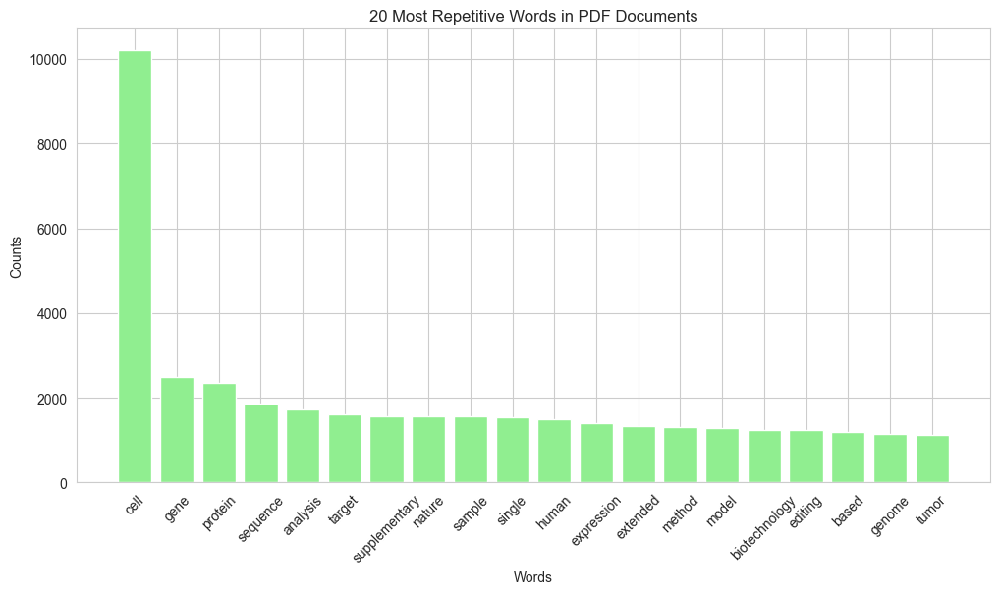

In [75]:
import matplotlib.pyplot as plt
from collections import Counter

# Flatten the list of all lemmatized tokens into a single list
all_tokens = [word for tokens in climate_service_pdf_tokens_lemmatized for word in tokens]

# Count the occurrences of each word
word_counts = Counter(all_tokens)

# Get the 20 most common words
most_common_words = word_counts.most_common(20)

# Separate the words and their counts for plotting
words, counts = zip(*most_common_words)

# Create the bar chart
plt.figure(figsize=(12, 6))
plt.bar(words, counts, color='lightgreen')
plt.title('20 Most Repetitive Words in PDF Documents')
plt.xlabel('Words')
plt.ylabel('Counts')
plt.xticks(rotation=45)
plt.show()

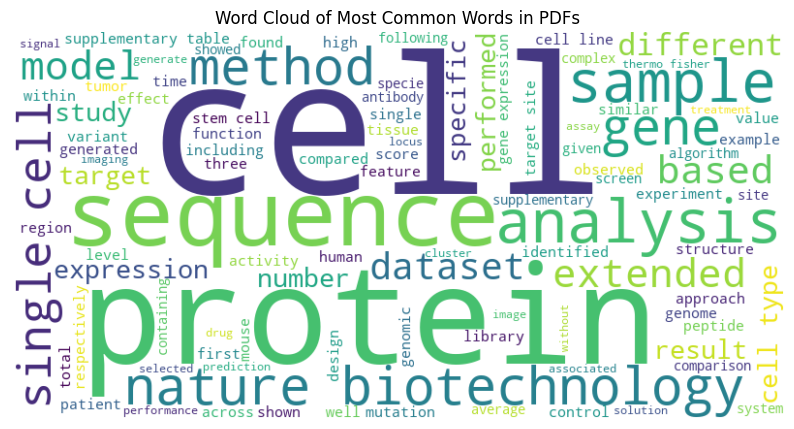

In [14]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all the lemmatized tokens into a single string
all_text = ' '.join(all_tokens)

# Create the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=100).generate(all_text)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Most Common Words in PDFs')
plt.show()

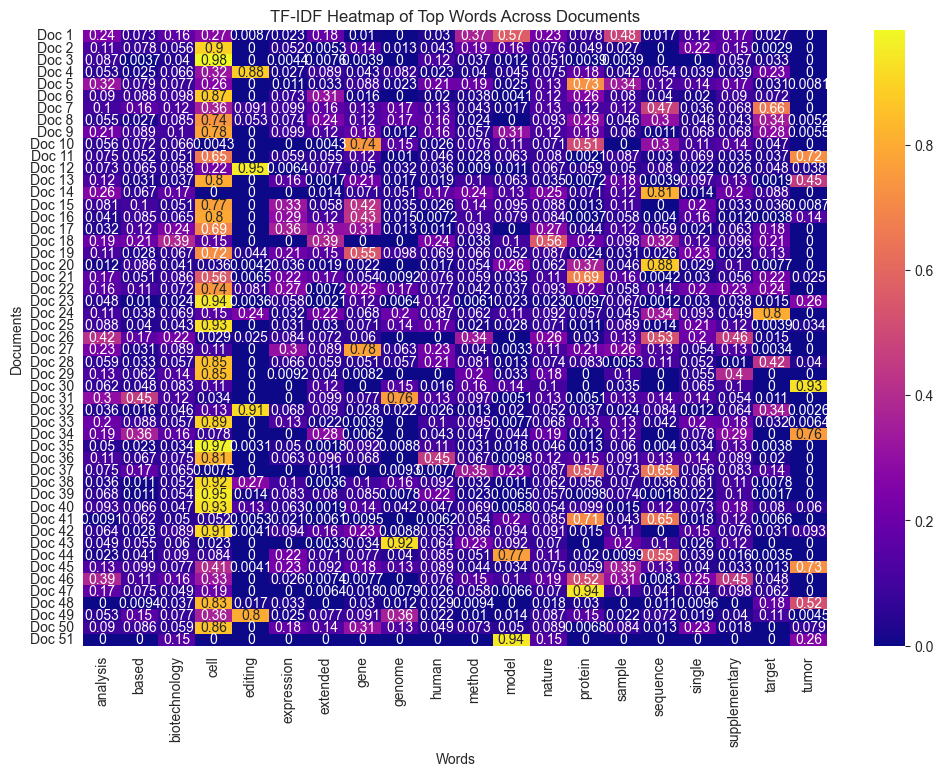

In [42]:
from sklearn.feature_extraction.text import TfidfVectorizer
import seaborn as sns

# Combine the cleaned tokens for each document into a single string
cleaned_texts = [' '.join(tokens) for tokens in climate_service_pdf_tokens_lemmatized]

# Compute TF-IDF
vectorizer = TfidfVectorizer(max_features=20)  # Limit to the top 20 words for simplicity
tfidf_matrix = vectorizer.fit_transform(cleaned_texts).toarray()

# Get the feature names (words)
words = vectorizer.get_feature_names_out()

# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(tfidf_matrix, xticklabels=words, yticklabels=[f'Doc {i+1}' for i in range(len(cleaned_texts))], cmap='plasma', annot=True)
plt.title('TF-IDF Heatmap of Top Words Across Documents')
plt.xlabel('Words')
plt.ylabel('Documents')
plt.show()

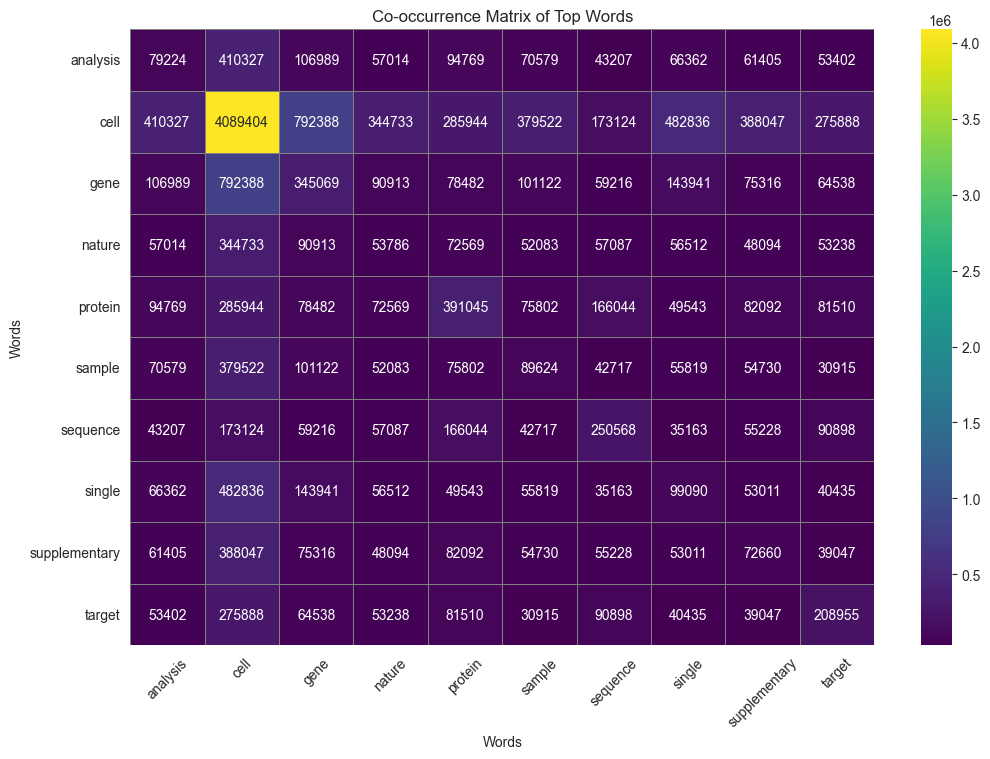

In [43]:
import pandas as pd
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer

# Use CountVectorizer to create the co-occurrence matrix
vectorizer = CountVectorizer(max_features=10)  # Limit to the top 10 words for simplicity
X = vectorizer.fit_transform(cleaned_texts)
co_occurrence_matrix = (X.T * X).toarray()

# Create a dataframe for better visualization
co_occurrence_df = pd.DataFrame(co_occurrence_matrix, index=vectorizer.get_feature_names_out(), columns=vectorizer.get_feature_names_out())

# Plot the heatmap with improvements
plt.figure(figsize=(12, 8))
sns.heatmap(co_occurrence_df, cmap='viridis', annot=True, fmt='d', linewidths=0.5, linecolor='gray')
plt.title('Co-occurrence Matrix of Top Words')
plt.xlabel('Words')
plt.ylabel('Words')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

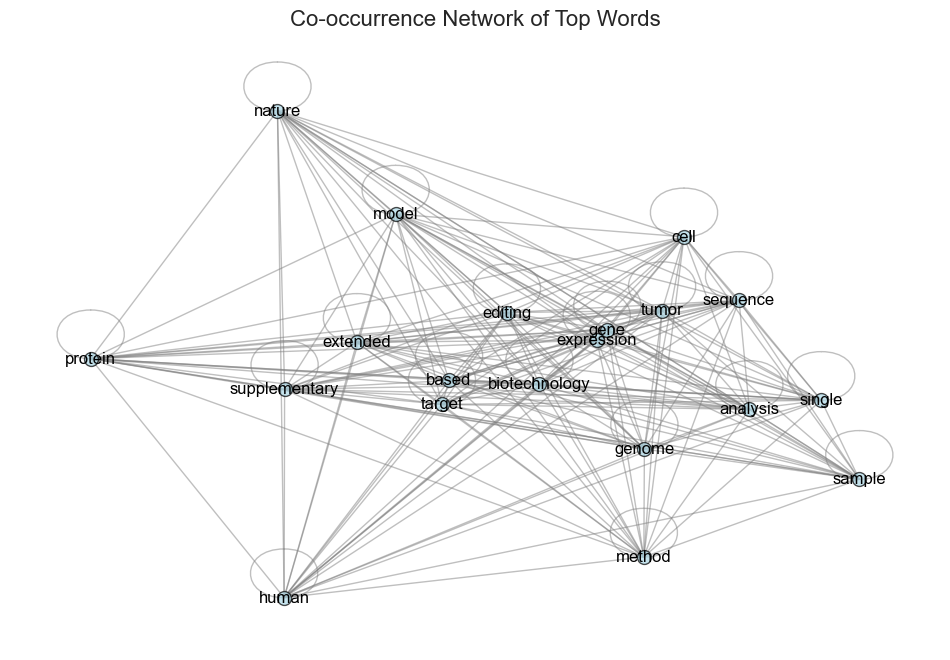

In [102]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import networkx as nx

# Assuming cleaned_texts is already defined
# Use CountVectorizer to create the co-occurrence matrix
vectorizer = CountVectorizer(max_features=20)  # Limit to the top 50 words for better analysis
X = vectorizer.fit_transform(cleaned_texts)
co_occurrence_matrix = (X.T * X).toarray()

# Create a dataframe for better visualization
co_occurrence_df = pd.DataFrame(co_occurrence_matrix, index=vectorizer.get_feature_names_out(), columns=vectorizer.get_feature_names_out())

# Create a graph from the co-occurrence matrix
G = nx.from_numpy_array(co_occurrence_matrix)

# Set the labels for the nodes
labels = vectorizer.get_feature_names_out()
mapping = {i: labels[i] for i in range(len(labels))}
G = nx.relabel_nodes(G, mapping)

# Draw the network diagram
plt.figure(figsize=(12, 8), facecolor='white')
pos = nx.spring_layout(G)  # Positions for all nodes

# Draw edges
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5, edge_color='gray')

# Draw nodes as points
x_values = [pos[node][0] for node in G.nodes()]
y_values = [pos[node][1] for node in G.nodes()]
plt.scatter(x_values, y_values, s=100, color='lightblue', alpha=0.7, edgecolors='black', linewidth=1)

# Draw labels
nx.draw_networkx_labels(G, pos, font_size=12, font_family='sans-serif')

plt.title('Co-occurrence Network of Top Words', fontsize=16)
plt.axis('off')  # Turn off the axis
plt.show()


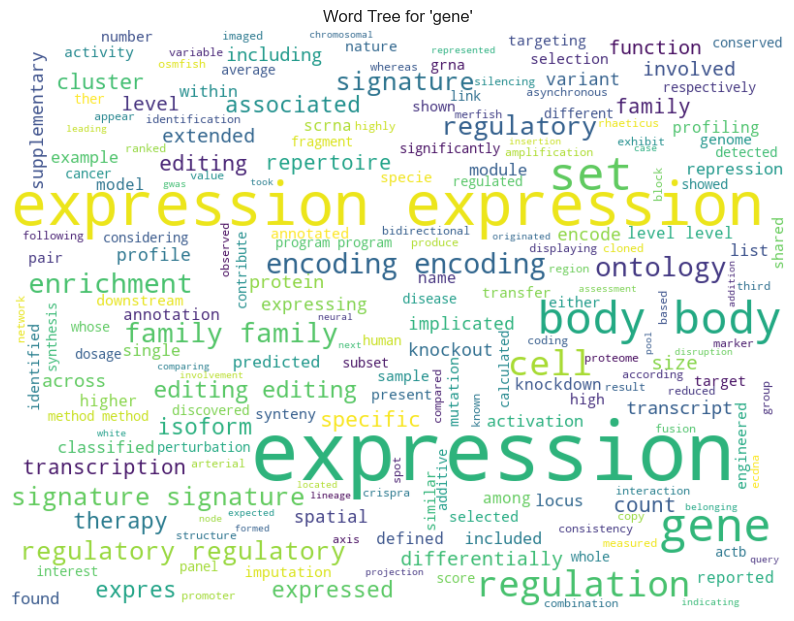

In [111]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

# Convert the cleaned words list into a single string
cleaned_text = ' '.join(all_tokens)

# Create a word tree for a specific root word
root_word = 'gene'  # Example root word to build the tree around

# Generate the word cloud with specific configurations for word tree
wordcloud = WordCloud(
    collocations=True,  # To detect word pairs
    background_color='white',
    contour_color='steelblue',
    stopwords=STOPWORDS,
    regexp=r'\b' + root_word + r'\b.*?\b(\w+)\b',  # This regex filters words after the root word
    width=800,
    height=600
).generate(cleaned_text)

# Plot the word tree
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title(f"Word Tree for '{root_word}'")
plt.show()


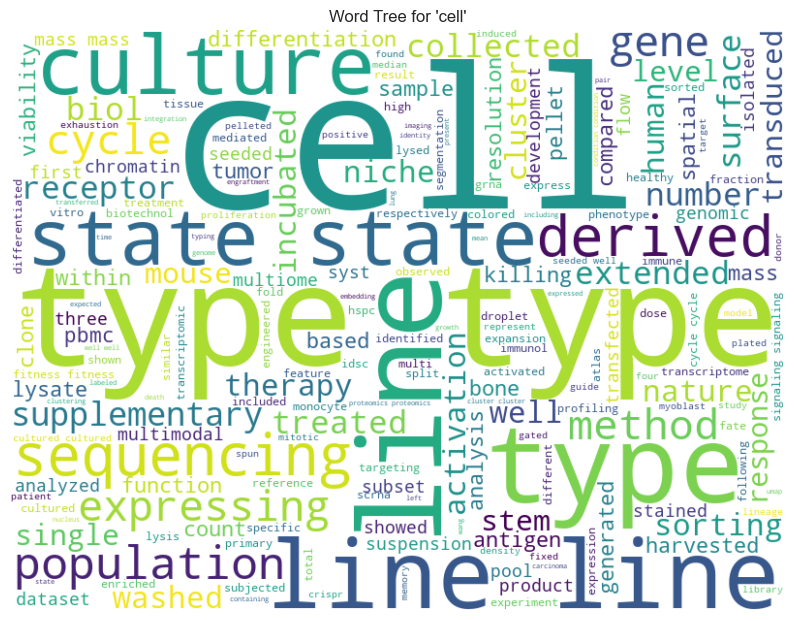

In [112]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

# Convert the cleaned words list into a single string
cleaned_text = ' '.join(all_tokens)

# Create a word tree for a specific root word
root_word = 'cell'  # Example root word to build the tree around

# Generate the word cloud with specific configurations for word tree
wordcloud = WordCloud(
    collocations=True,  # To detect word pairs
    background_color='white',
    contour_color='steelblue',
    stopwords=STOPWORDS,
    regexp=r'\b' + root_word + r'\b.*?\b(\w+)\b',  # This regex filters words after the root word
    width=800,
    height=600
).generate(cleaned_text)

# Plot the word tree
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title(f"Word Tree for '{root_word}'")
plt.show()


In [107]:
!pip install networkx

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


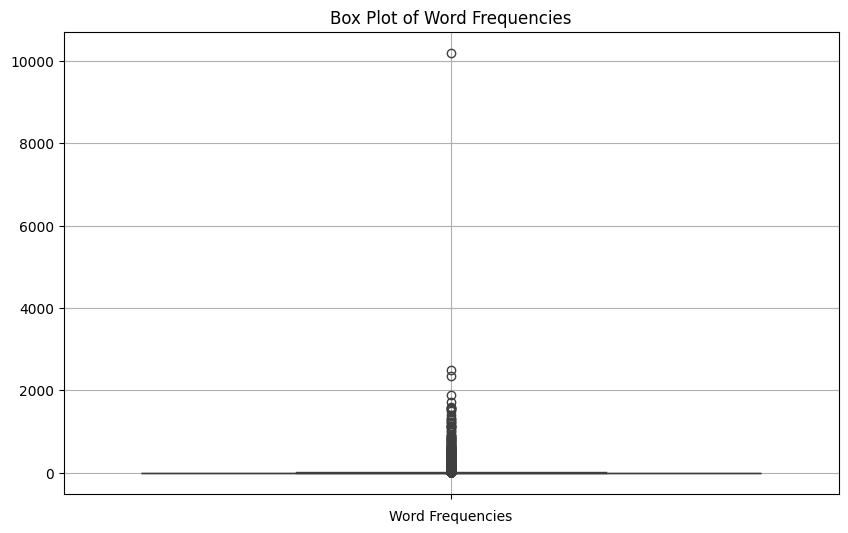

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Count word frequencies in the cleaned words
word_frequencies = Counter(all_tokens)

# Convert word frequencies to a list of values
freq_values = list(word_frequencies.values())

# Plot a box plot for word frequencies
plt.figure(figsize=(10, 6))
sns.boxplot(data=freq_values)

# Add title and labels
plt.title('Box Plot of Word Frequencies')
plt.xlabel('Word Frequencies')
plt.grid(True)

# Show the plot
plt.show()



# Document Term Matrix

In [20]:
from sklearn.feature_extraction.text import CountVectorizer

# Join the lemmatized tokens back into a single string for each PDF
documents = [' '.join(tokens) for tokens in climate_service_pdf_tokens_lemmatized]

# Initialize CountVectorizer to create the DTM
vectorizer = CountVectorizer()

# Create the Document-Term Matrix
dtm = vectorizer.fit_transform(documents)

# Convert the DTM to a DataFrame for better visualization
import pandas as pd

dtm_df = pd.DataFrame(dtm.toarray(), columns=vectorizer.get_feature_names_out())

# Display the shape of the DTM and the first few rows
print(f"Document-Term Matrix shape: {dtm_df.shape}")
print(dtm_df.head())

Document-Term Matrix shape: (51, 27883)
   aaaaa  aaaaaa  aaaaaaaga  aaaaaagcac  aaaaaagcaccgactcggtgcc  aaac  \
0      0       0          0           0                       0     0   
1      0       0          0           0                       0     0   
2      0       0          0           0                       0     0   
3      0       0          0           0                       0     0   
4      0       0          0           0                       0     0   

   aaacagatcacccgctgagcgggttatctgttcnumber  aaai  aaalac  aaat  ...  zygosity  \
0                                        0     0       0     0  ...         0   
1                                        0     0       0     0  ...         0   
2                                        0     0       0     0  ...         0   
3                                        0     0       0     0  ...         0   
4                                        0     0       0     0  ...         0   

   zygote  zygotic  zygous  zyla  

# LDA

In [21]:
from sklearn.decomposition import LatentDirichletAllocation

# Create the LDA model
lda = LatentDirichletAllocation(n_components=5, random_state=42)

# Fit the LDA model on the DTM
lda.fit(dtm)

LatentDirichletAllocation(n_components=5, random_state=42)

# Top 15 words for each topic

In [89]:
# Function to display the top words for each topic
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx + 1}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))
        print()

# Display the top words for each topic
no_top_words = 15  # Number of top words to display for each topic
display_topics(lda, vectorizer.get_feature_names_out(), no_top_words)

Topic 1:
protein sequence cell model analysis proteome supplementary gene complex method based peptide change sample structure

Topic 2:
cell editing target site sequence antibody protein extended variant human guide analysis mouse nature read

Topic 3:
cell human gene tumor mouse sample analysis study supplementary nature model single feature patient line

Topic 4:
cell gene single expression type extended perturbation spatial method score analysis raman nature drug state

Topic 5:
sequence protein genome supplementary cell gene read nature sample method design model high tumor structure



Research investigates cellular and genetic mechanisms and their interactions.

Emphasis is placed on protein function and analysis related to genetics.

Studies showcase various research methodologies in biological analysis.

Topics address tumor biology and its genetic factors.

Discussion centers on genetic variation and editing advancements

# Mapping each article to a topic

In [23]:
import numpy as np
import pandas as pd

# Get the topic distribution for each document
topic_distribution = lda.transform(dtm)

# Get the dominant topic for each document (PDF)
core_topics = np.argmax(topic_distribution, axis=1)

# Prepare a list of PDF file names (assuming they are stored in the original folder path)
pdf_filenames = os.listdir(folder_path)

# Create a DataFrame to map PDF names to their dominant topics
topics_df = pd.DataFrame({
    'PDF File Name': pdf_filenames,
    'Core Topic': core_topics + 1  # Adding 1 to make topics start from 1
})

# Display the DataFrame
print(topics_df)

             PDF File Name  Core Topic
0   s41587-023-02033-x.pdf           3
1   s41587-023-02040-y.pdf           4
2   s41587-023-02055-5.pdf           3
3   s41587-023-02078-y.pdf           2
4   s41587-023-02099-7.pdf           1
5   s41587-023-02107-w.pdf           2
6   s41587-023-02121-y.pdf           2
7   s41587-024-02137-y.pdf           2
8   s41587-024-02143-0.pdf           3
9   s41587-024-02147-w.pdf           1
10  s41587-024-02161-y.pdf           3
11  s41587-024-02172-9.pdf           2
12  s41587-024-02173-8.pdf           4
13  s41587-024-02175-6.pdf           5
14  s41587-024-02182-7.pdf           3
15  s41587-024-02193-4.pdf           4
16  s41587-024-02194-3.pdf           5
17  s41587-024-02209-z.pdf           5
18  s41587-024-02213-3.pdf           4
19  s41587-024-02214-2.pdf           5
20  s41587-024-02218-y.pdf           4
21  s41587-024-02224-0.pdf           2
22  s41587-024-02226-y.pdf           3
23  s41587-024-02238-8.pdf           2
24  s41587-024-02241-z.pd

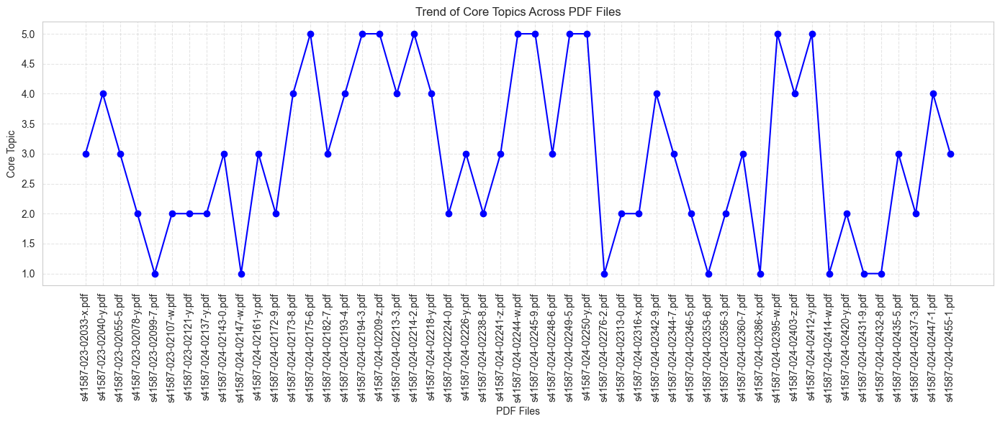

In [53]:
import matplotlib.pyplot as plt

# Plot the core topics as a line trend
plt.figure(figsize=(14, 6))
plt.plot(topics_df.index, topics_df['Core Topic'], marker='o', color='b', linestyle='-', linewidth=1.5, markersize=6)
plt.xticks(ticks=topics_df.index, labels=topics_df['PDF File Name'], rotation=90)  # Rotate PDF names for readability
plt.title('Trend of Core Topics Across PDF Files')
plt.xlabel('PDF Files')
plt.ylabel('Core Topic')
plt.grid(visible=True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


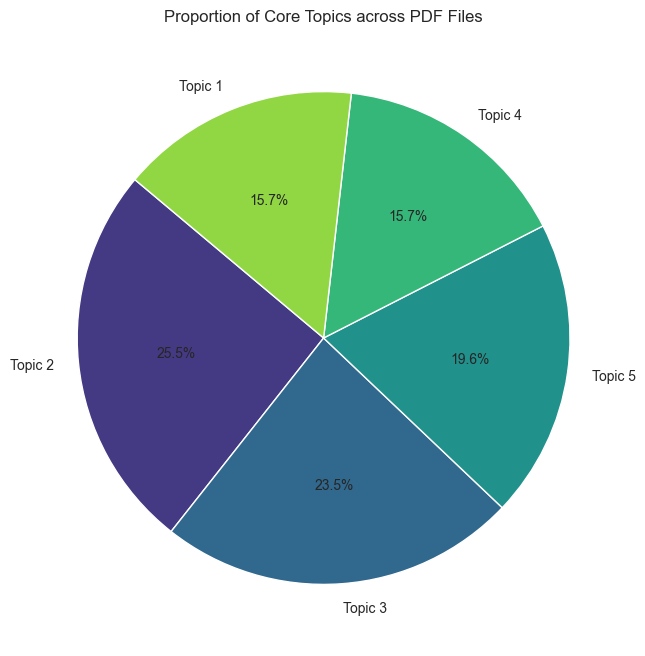

In [54]:
import matplotlib.pyplot as plt

# Count the number of PDFs for each core topic
topic_counts = topics_df['Core Topic'].value_counts()

# Plot pie chart
plt.figure(figsize=(8, 8))
plt.pie(topic_counts, labels=[f'Topic {i}' for i in topic_counts.index], autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(topic_counts)))
plt.title('Proportion of Core Topics across PDF Files')
plt.show()


# List of PDF Files by Topics

In [24]:
# Create a dictionary to store PDF file names by topic
pdfs_by_topic = {}

# Group the DataFrame by 'Dominant Topic' and populate the dictionary
for topic, group in topics_df.groupby('Core Topic'):
    pdfs_by_topic[topic] = group['PDF File Name'].tolist()

# Display the dictionary
for topic, pdfs in pdfs_by_topic.items():
    print(f"Topic {topic}:")
    for pdf in pdfs:
        print(f"  - {pdf}")

Topic 1:
  - s41587-023-02099-7.pdf
  - s41587-024-02147-w.pdf
  - s41587-024-02276-2.pdf
  - s41587-024-02353-6.pdf
  - s41587-024-02386-x.pdf
  - s41587-024-02414-w.pdf
  - s41587-024-02431-9.pdf
  - s41587-024-02432-8.pdf
Topic 2:
  - s41587-023-02078-y.pdf
  - s41587-023-02107-w.pdf
  - s41587-023-02121-y.pdf
  - s41587-024-02137-y.pdf
  - s41587-024-02172-9.pdf
  - s41587-024-02224-0.pdf
  - s41587-024-02238-8.pdf
  - s41587-024-02313-0.pdf
  - s41587-024-02316-x.pdf
  - s41587-024-02346-5.pdf
  - s41587-024-02356-3.pdf
  - s41587-024-02420-y.pdf
  - s41587-024-02437-3.pdf
Topic 3:
  - s41587-023-02033-x.pdf
  - s41587-023-02055-5.pdf
  - s41587-024-02143-0.pdf
  - s41587-024-02161-y.pdf
  - s41587-024-02182-7.pdf
  - s41587-024-02226-y.pdf
  - s41587-024-02241-z.pdf
  - s41587-024-02248-6.pdf
  - s41587-024-02344-7.pdf
  - s41587-024-02360-7.pdf
  - s41587-024-02435-5.pdf
  - s41587-024-02455-1.pdf
Topic 4:
  - s41587-023-02040-y.pdf
  - s41587-024-02173-8.pdf
  - s41587-024-0219

# Summarized Table

In [25]:
# Count the number of articles per dominant topic
topic_counts = topics_df['Core Topic'].value_counts().sort_index()

# Display the count of articles per topic
print("\nCount of articles per core topic:")
print(topic_counts)


Count of articles per core topic:
Core Topic
1     8
2    13
3    12
4     8
5    10
Name: count, dtype: int64


C:\Users\haris\AppData\Local\Temp\ipykernel_17692\897534569.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Core Topic', data=topics_df, palette='viridis')


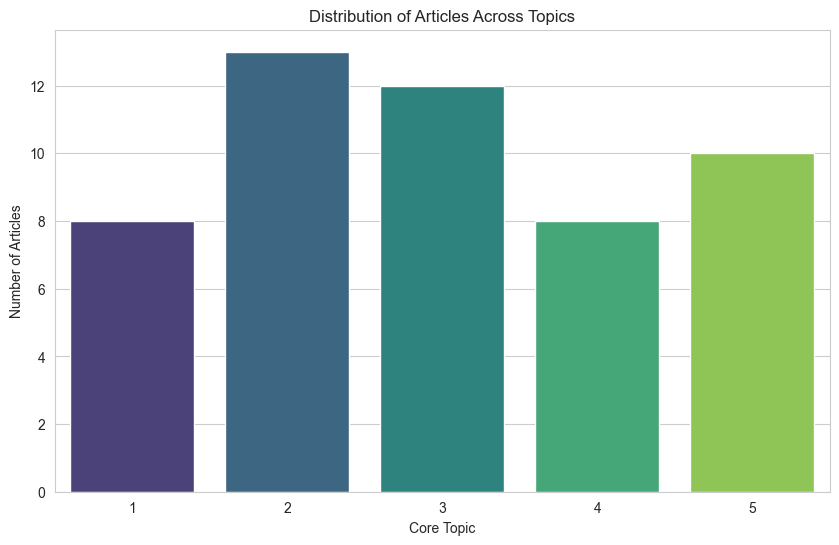

In [44]:
# prompt: display topic df as a visualisation

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'topics_df' is already created as in your provided code

# Create the countplot
plt.figure(figsize=(10, 6))
sns.countplot(x='Core Topic', data=topics_df, palette='viridis')
plt.title('Distribution of Articles Across Topics')
plt.xlabel('Core Topic')
plt.ylabel('Number of Articles')
plt.show()